In [1]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)])  # 4GB limit
    except RuntimeError as e:
        print(e)


2025-06-22 17:49:01.099577: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750614541.147379  689538 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750614541.160454  689538 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1750614541.245361  689538 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1750614541.245440  689538 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1750614541.245443  689538 computation_placer.cc:177] computation placer alr

In [2]:
NUM_SENTENCES = 1000 # Use only the first 20,000 records.
MAX_NUM_WORDS = 7000

BATCH_SIZE = 128
EPOCHS = 500
EMBEDDING_SIZE = 100

INFERENCE_LSTM_NEURONS = 256

In [3]:
import csv
import random
def read_text_file(filename):
    lines = []
    try:
        with open(filename, newline='\n', encoding='utf-8') as csvfile:
            csv_reader = csv.reader(csvfile)
            for row in csv_reader:
              lines.append(row)
              if len(lines) >= NUM_SENTENCES * 2:
                break
        #print(len(lines))
        #print(lines[0])
        return lines
    except FileNotFoundError:
        return f"Error: The file '{filename}' was not found."
    except Exception as e:
        return f"An error occurred: {e}"


file_name = '/mnt/d/Work/wsl/ML-DS/english_to_bangla.csv'
# Read the content of the file
lines_t = read_text_file(file_name)
lines =  random.sample(lines_t, min(NUM_SENTENCES, len(lines_t)))


In [4]:
len(lines)

1000

In [5]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

input_texts = []
target_texts = []
decoder_input_texts = []
decoder_target_texts = []

for line in lines:
    input_texts.append(line[0])
    target_texts.append('<sos> ' + line[1] + ' <eos>')
    decoder_input_texts.append('<sos> ' + line[1])
    decoder_target_texts.append(line[1] + ' <eos>')


In [6]:
max_input_words = max(len(text) for text in input_texts)
max_target_words = max(len(text) for text in target_texts)

MAX_SENT_LEN = max(max_target_words, max_target_words)
print("MAX_SENT_LEN:", MAX_SENT_LEN)


MAX_SENT_LEN: 171


In [7]:
max_len = max(len(text) for text in input_texts)
print(max_len)

151


In [8]:
i = 2
print(input_texts[i])
print(target_texts[i])
print(decoder_input_texts[i])
print(decoder_target_texts[i])

two tired children rest on couches at an art museum while the adults around them view the art .
<sos> চারপাশে প্রাপ্ত বয়স্করা এই শিল্পটি দেখার সময় দুটি ক্লান্ত শিশু একটি আর্ট মিউজিয়ামে পালঙ্কে বিশ্রাম দেয়। <eos>
<sos> চারপাশে প্রাপ্ত বয়স্করা এই শিল্পটি দেখার সময় দুটি ক্লান্ত শিশু একটি আর্ট মিউজিয়ামে পালঙ্কে বিশ্রাম দেয়।
চারপাশে প্রাপ্ত বয়স্করা এই শিল্পটি দেখার সময় দুটি ক্লান্ত শিশু একটি আর্ট মিউজিয়ামে পালঙ্কে বিশ্রাম দেয়। <eos>


**Reasoning**:
Next, tokenize and pad the English and Bengali sequences according to the specified parameters.



In [9]:
# Tokenize and pad English sequences
input_tokenizer = Tokenizer(num_words=MAX_NUM_WORDS, filters='', oov_token='<unk>')
input_tokenizer.fit_on_texts(input_texts)
input_sequences = input_tokenizer.texts_to_sequences(input_texts)
input_sequences_padded = pad_sequences(input_sequences, maxlen=MAX_SENT_LEN, padding='post')

# Tokenize and pad Bengali sequences
target_tokenizer = Tokenizer(num_words=MAX_NUM_WORDS, filters='', oov_token='<unk>')
target_tokenizer.fit_on_texts(target_texts)

#target_sequences = target_tokenizer.texts_to_sequences(target_texts)
#target_sequences_padded = pad_sequences(target_sequences, maxlen=MAX_SENT_LEN, padding='post')

decoder_input_data = target_tokenizer.texts_to_sequences(decoder_input_texts)
decoder_input_data_padded = pad_sequences(decoder_input_data, maxlen=MAX_SENT_LEN, padding='post')

decoder_target_data = target_tokenizer.texts_to_sequences(decoder_target_texts)
decoder_target_data_padded = pad_sequences(decoder_target_data, maxlen=MAX_SENT_LEN, padding='post')


# Create decoder input data and decoder target data again with the refitted tokenizer
# Input before <eos>
#decoder_input_data = target_sequences_padded[:, :-1]
# Target after <sos>
#decoder_target_data = target_sequences_padded[:, 1:]


In [10]:
#import random
#d = target_tokenizer.word_index
#print(random.sample(list(d.items()), min(5, len(d))))

In [11]:
#decoder_target_data_padded[10]

## Load pre-trained embeddings

### Subtask:
Load the GloVe embeddings for the English words.


**Reasoning**:
Load the GloVe embeddings from the specified file and store them in a dictionary, then create an embedding matrix for the English words based on the loaded embeddings and the English word index.



In [12]:
glove_file_path = f'/mnt/d/Work/wsl/ML-DS/glove.6B.{EMBEDDING_SIZE}d.txt' 
embeddings_dict = {}
with open(glove_file_path, 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = np.asarray(values[1:], dtype='float32')
        embeddings_dict[word] = vector

embedding_matrix = np.zeros((MAX_NUM_WORDS, EMBEDDING_SIZE))
for word, i in input_tokenizer.word_index.items():
    if i < MAX_NUM_WORDS:
        embedding_vector = embeddings_dict.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector


## Define the encoder-decoder model with luong attention

### Subtask:
Build the model architecture, including the encoder, decoder with Luong-style attention, and necessary layers.


**Reasoning**:
Define the encoder, decoder, and the full Luong Attention model architecture using Keras layers.



In [13]:
from os import name
from tensorflow.keras.layers import Input, LSTM, Dense, Embedding, Attention, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

# Define the encoder model
encoder_inputs = Input(shape=(MAX_SENT_LEN,), name = 'encoder_inputs')
encoder_embedding = Embedding(input_dim=MAX_NUM_WORDS, output_dim=EMBEDDING_SIZE, weights=[embedding_matrix], trainable=False, name = 'encoder_embedding')(encoder_inputs)
encoder_lstm, encoder_lstm_state_h, encoder_lstm__state_c  = LSTM(INFERENCE_LSTM_NEURONS, return_sequences=True, return_state=True, kernel_regularizer=regularizers.l2(0.001), name = 'encoder_lstm')(encoder_embedding)
encoder_states = [encoder_lstm_state_h, encoder_lstm__state_c]
#encoder_model = Model(encoder_inputs, encoder_lstm, name = 'encoder_model')

# Define the decoder model
decoder_inputs = Input(shape=(MAX_SENT_LEN,), name = 'decoder_inputs')
decoder_embedding = Embedding(input_dim=target_tokenizer.num_words, output_dim=EMBEDDING_SIZE, name = 'decoder_embedding')
decoder_embedding_t = decoder_embedding(decoder_inputs)
decoder_lstm_t = LSTM(INFERENCE_LSTM_NEURONS, return_sequences=True, return_state=True, kernel_regularizer=regularizers.l2(0.001), name = 'decoder_lstm_t')
decoder_lstm, _, _ = decoder_lstm_t(decoder_embedding_t, initial_state=encoder_states)

# Luong Attention
#Dot-product attention layer, a.k.a. Luong-style attention
#score_mode="dot",
attention = Attention(score_mode="dot", name = 'attention')
context_vector =  BatchNormalization()(attention([decoder_lstm, encoder_lstm]))

# Concatenate context vector with decoder output
decoder_concat_input = Concatenate(axis=-1, name = 'decoder_concat_input')([decoder_lstm, context_vector])

# Dense layer for output
decoder_dense = tf.keras.layers.TimeDistributed(Dense(target_tokenizer.num_words, activation='softmax', kernel_regularizer=regularizers.l2(0.001), name = 'decoder_dense'), name = 'timeDistributed_decoder_dense')
decoder_dense_t = decoder_dense(decoder_concat_input)

# Define the full model
trining_model = Model([encoder_inputs, decoder_inputs], decoder_dense_t, name = 'trining_model')


# Compile the model
trining_model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
trining_model.summary()


I0000 00:00:1750614564.731342  689538 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4096 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5


Model: "trining_model"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ encoder_inputs      │ (None, 171)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder_inputs      │ (None, 171)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_embedding   │ (None, 171, 100)  │    700,000 │ encoder_inputs[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder_embedding   │ (None, 171, 100)  │    700,000 │ decoder_inputs[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_lstm (LSTM) │ [(None, 171,      │    365,568 │ encoder_embeddin… │
│                     │ 256), (None,      │            │                   │
│                     │ 256), (None,      │            │                   │
│                     │ 256)]             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder_lstm_t      │ [(None, 171,      │    365,568 │ decoder_embeddin… │
│ (LSTM)              │ 256), (None,      │            │ encoder_lstm[0][… │
│                     │ 256), (None,      │            │ encoder_lstm[0][… │
│                     │ 256)]             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attention           │ (None, 171, 256)  │          0 │ decoder_lstm_t[0… │
│ (Attention)         │                   │            │ encoder_lstm[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 171, 256)  │      1,024 │ attention[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder_concat_inp… │ (None, 171, 512)  │          0 │ decoder_lstm_t[0… │
│ (Concatenate)       │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ timeDistributed_de… │ (None, 171, 7000) │  3,591,000 │ decoder_concat_i… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,723,160 (21.83 MB)

 Trainable params: 5,022,648 (19.16 MB)

 Non-trainable params: 700,512 (2.67 MB)

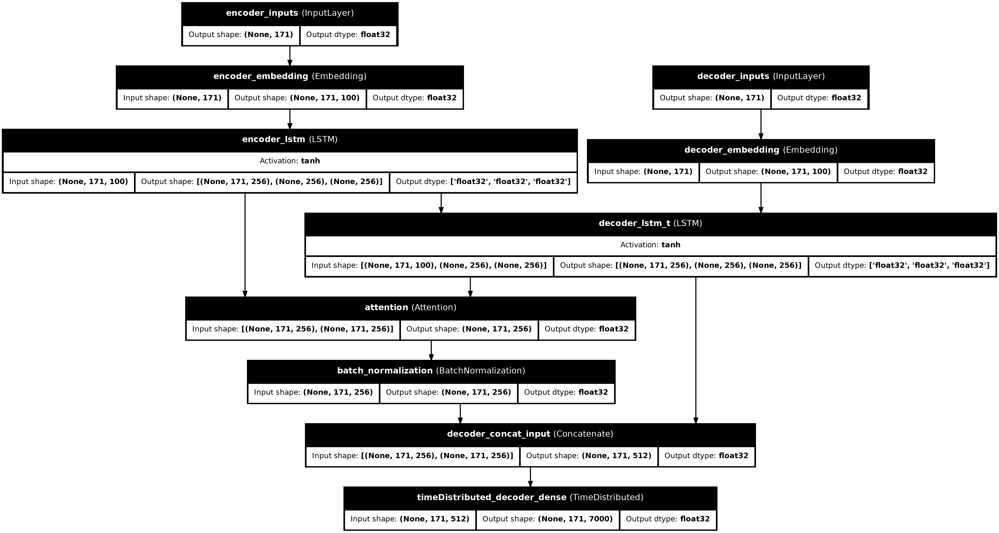

In [14]:
from tensorflow.keras.utils import plot_model
plot_model(trining_model, to_file='model_architecture.png',
           show_shapes=True, show_layer_names=True, show_layer_activations=True,
           show_dtype=True,  expand_nested=True, show_trainable=False)


## Compile and train the model

**Reasoning**:
Compile the model and train it with early stopping.

In [15]:
# Split data
from sklearn.model_selection import train_test_split

VALIDATION_SPLIT = 0.2

X_train_en, X_val_en, X_train_bn, X_val_bn, y_train, y_val = train_test_split(
    input_sequences_padded, decoder_input_data_padded, decoder_target_data_padded,
    test_size=VALIDATION_SPLIT, random_state=42
)


In [16]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
import datetime


"""# 3. Create a unique log directory for each run
# This is crucial for comparing different training runs in TensorBoard
log_dir = os.path.join(
    "logs",
    "fit",
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
)
# Ensure the directory exists
os.makedirs(log_dir, exist_ok=True)


# 4. Create the TensorBoard callback
# log_dir: Specifies the directory where event files will be written.
# histogram_freq: Frequency (in epochs) at which to compute activation and weight histograms.
#                 Set to 1 to compute histograms every epoch.
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1
)
print(f"TensorBoard logs will be saved to: {log_dir}")
"""

class StepBasedLogging(tf.keras.callbacks.Callback):
    def set_model(self, model):
        super().set_model(model)
        # Add any additional initialization if needed
        self._model = model  # Optionally store the model if needed later
    def __init__(self, log_interval=10):
        super(StepBasedLogging, self).__init__()
        self.log_interval = log_interval
        self.step_counter = 0

    def on_train_batch_end(self, epoch, logs=None):
        self.step_counter += 1
        if self.step_counter == 0 or self.step_counter % self.log_interval == 0:
            print(f"Epoch {self.step_counter}:", "logs:", logs) 
            if 'val_loss' in logs:
                print(f"  Validation Loss: {logs.get('val_loss', 0):.4f}")
            if 'val_accuracy' in logs:
                print(f"  Validation Accuracy: {logs['val_accuracy']:.4f}")
             

# Instantiate EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, min_delta=0.00001, verbose=1)

#Pass encoder_input and decoder_input as inputs, and decoder_target as the target.
#Keras automatically applies teacher forcing by feeding decoder_input to the decoder.
# Train the model
#history = trining_model.fit([input_sequences_padded, decoder_input_data_padded], decoder_target_data_padded,
#                    batch_size=BATCH_SIZE,
#                    epochs=EPOCHS,
#                    validation_split=0.2,
#                    callbacks=[early_stopping, tensorboard_callback])
step_logging = StepBasedLogging(log_interval=50)
history = trining_model.fit([X_train_en, X_train_bn], y_train,
                    validation_data=([X_val_en, X_val_bn], y_val),
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    verbose = 1,
                    callbacks=[#early_stopping
                       #,step_logging
                      #,tensorboard_callback
                    ]
                    )


# Plot training and validation loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/500


I0000 00:00:1750614576.327589  689591 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-06-22 17:49:51.402074: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:501] Allocator (GPU_0_bfc) ran out of memory trying to allocate 42.75MiB (rounded to 44826624)requested by op StatefulPartitionedCall/gradient_tape/trining_model_1/timeDistributed_decoder_dense_1/strided_slice_52/StridedSliceGrad
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-06-22 17:49:51.402266: I external/local_xla/xla/tsl/framework/bfc_allocator.cc:1058] BFCAllocator dump for GPU_0_bfc
2025-06-22 17:49:51.402300: I external/local_xla/xla/tsl/framework/bfc_allocator.cc:1065] Bin (256): 	Total Chunks: 55, Chunks in use: 54. 13.8KiB allocated for chunks. 13.5KiB in use in bin. 264B client-requested in use in bin.
2025-06-22 17:49:51.402309: I external/local_xl

ResourceExhaustedError: Graph execution error:

Detected at node gradient_tape/trining_model_1/timeDistributed_decoder_dense_1/strided_slice_52/StridedSliceGrad defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/kernelapp.py", line 739, in start

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/tornado/platform/asyncio.py", line 211, in start

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/asyncio/base_events.py", line 639, in run_forever

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/asyncio/base_events.py", line 1985, in _run_once

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/asyncio/events.py", line 88, in _run

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 534, in process_one

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 362, in execute_request

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 778, in execute_request

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 449, in do_execute

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3100, in run_cell

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3155, in _run_cell

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3367, in run_cell_async

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3612, in run_ast_nodes

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3672, in run_code

  File "/tmp/ipykernel_689538/1160942278.py", line 61, in <module>

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 377, in fit

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 220, in function

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 133, in multi_step_on_iterator

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 114, in one_step_on_data

  File "/home/sid/miniconda3/envs/tensorflow-2.19_new/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 78, in train_step

OOM when allocating tensor with shape[171,128,512] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/trining_model_1/timeDistributed_decoder_dense_1/strided_slice_52/StridedSliceGrad}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_multi_step_on_iterator_11536]

## Implement inference model

### Subtask:
Create a separate model or function for translating new English sentences into Bengali.


**Reasoning**:
Define the encoder and decoder inference models and the translation function.



In [ ]:
# MY

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Attention, Concatenate
import numpy as np

# Define the encoder inference model
#encoder_inputs_inference = Input(shape=(MAX_SENT_LEN,), name = 'encoder_inputs_inference')
#encoder_embedding_inference = Embedding(input_dim=MAX_NUM_WORDS, output_dim=EMBEDDING_SIZE, weights=[embedding_matrix], trainable=False)(encoder_inputs_inference)
#encoder_lstm_inference = LSTM(INFERENCE_LSTM_NEURONS, return_sequences=True, name = 'encoder_lstm_inference')(encoder_embedding_inference)
encoder_inference_model = Model(encoder_inputs, [encoder_lstm, encoder_states], name = 'encoder_inference_model')


# Define the decoder inference model
decoder_inputs_inference = Input(shape=(1,), name = 'decoder_inputs_inference') # Process one token at a time
decoder_state_h_inf = Input(shape=(INFERENCE_LSTM_NEURONS,), name = 'decoder_state_h_inf') # Assuming LSTM state size is 256
decoder_state_c_inf = Input(shape=(INFERENCE_LSTM_NEURONS,), name = 'decoder_state_c_inf') # Assuming LSTM state size is 256
decoder_states_inputs_inf = [decoder_state_h_inf, decoder_state_c_inf]
encoder_outputs_inference = Input(shape=(None, INFERENCE_LSTM_NEURONS), name = 'encoder_outputs_inference') # Encoder output sequence

decoder_embedding_inference = decoder_embedding(decoder_inputs_inference)

decoder_lstm_inference, state_h_inf, state_c_inf = decoder_lstm_t(
    decoder_embedding_inference, initial_state=decoder_states_inputs_inf)

decoder_states_inference = [state_h_inf, state_c_inf]

# Luong Attention for inference
attention_inference = attention([decoder_lstm_inference, encoder_outputs_inference])
context_vector_inference = BatchNormalization()(attention_inference)

# Concatenate context vector with decoder output
decoder_concat_input_inference = Concatenate(axis=-1, name= 'decoder_concat_input_inference')([decoder_lstm_inference, attention_inference])

# Dense layer for output
#decoder_dense_inference = Dense(target_tokenizer.num_words, activation='softmax', name = 'decoder_dense_inference')(decoder_concat_input_inference)
decoder_dense_inference = decoder_dense(decoder_concat_input_inference)

#decoder_inference_model = Model([decoder_inputs_inference, encoder_outputs_inference] + decoder_states_inputs_inf, [decoder_dense_inference] + decoder_states_inference, name = 'decoder_inference_model')
decoder_inference_model = Model(
    [decoder_inputs_inference, decoder_states_inputs_inf, encoder_outputs_inference],
    [decoder_dense_inference] + decoder_states_inference
)

decoder_inference_model.summary()

In [ ]:

plot_model(decoder_inference_model, to_file='decoder_inference_model_architecture.png',
           show_shapes=True, show_layer_names=True, show_layer_activations=True,
           show_dtype=True,  expand_nested=True, show_trainable=False)


In [ ]:
# Function to translate an English sentence
def translate_sentence(input_sentence):
    # Preprocess the input sentence
    input_seq = input_tokenizer.texts_to_sequences([input_sentence])
    input_seq_padded = pad_sequences(input_seq, maxlen=MAX_SENT_LEN, padding='post')

    # Get encoder output
    encoder_output_sequence, states_value = encoder_inference_model.predict(input_seq_padded, verbose = 0)

    # Initialize decoder state and input
    target_seq = np.zeros((1, 1))
    target_seq[0, 0] = target_tokenizer.word_index['<sos>']
    # Initialize decoder states to zero (or could use the final encoder state if available)
    #decoder_states = [np.zeros((1, INFERENCE_LSTM_NEURONS)), np.zeros((1, INFERENCE_LSTM_NEURONS))]
    #decoder_states = [state_h, state_c]

    translated_sentence = ''

    # Sampling loop for a batch of sequences
    for i in range(MAX_SENT_LEN):
        output_tokens, h, c = decoder_inference_model.predict([target_seq, states_value, encoder_output_sequence], verbose = 0)

        # Sample a token
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_word = target_tokenizer.index_word.get(sampled_token_index, '')


        #print("i = ", str(i), str(sampled_token_index), sampled_word)

        # Exit condition: either hit max length or find stop token.
        if sampled_word == '<eos>':
            break

        # Append sampled word to the translated sentence
        translated_sentence += ' ' + sampled_word

        # Update the target sequence (of length 1).
        target_seq = np.zeros((1, 1))
        target_seq[0, 0] = sampled_token_index

        # Update states
        states_value = [h, c]

    return translated_sentence.strip()


In [ ]:
print(target_texts[5])

In [ ]:
from numpy import random

i = random.choice(len(input_sequences_padded))
input_seq = input_texts[i:i+1]
translation = translate_sentence(input_seq)

print('Input:', input_texts[i])
print('Response:', translation)

In [ ]:
import random
# Now, test the inference model again
example_sentences = [ 
    "a dog is on the grass",
    "a girl is playing with a ball",
    "a man is in the house"
]

# Translate and print the example sentences
for sentence in example_sentences + random.sample(input_texts, min(100, len(input_texts))):
    print(f"English: {sentence}")
    translated_sentence = translate_sentence(sentence)
    print(f"Bengali: {translated_sentence}")
    print("-" * 20)